<a href="https://colab.research.google.com/github/aksg87/organ-segmentation-tutorial-pytorch/blob/main/Organ_Segmentation_Pytorch_Tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#INTRODUCTION

Below is an example of using a UNet for organ segmentation.


Note: The data set for this tutorial is opensource and provided by: 

A.E. Kavur, M. A. Selver, O. Dicle, M. Barış,  N.S. Gezer. CHAOS - Combined (CT-MR) Healthy Abdominal Organ Segmentation Challenge Data (Version v1.03) [Data set]. Apr.  2019. Zenodo. http://doi.org/10.5281/zenodo.3362844

If there is an issue with the dropbox link in this tutorial you can directly download the CHAOS dataset from that official url.



# INSTALL PYDYCOM AND DOWNLOAD DATA/CODE

In [1]:
!pip install pydicom #radiology dicom image library
!apt-get -qq install  pv #progress bar/outputs


In [2]:
!wget -q --show-progress https://www.dropbox.com/s/65yy0uospa57439/UNET_COLAB.zip?dl=1 #download data from dropbox
n_files = !unzip -l /content/UNET_COLAB.zip\?dl\=1 | grep . | wc -l #n_files is used for progress bar
!unzip -o /content/UNET_COLAB.zip\?dl\=1 | pv -l -s {n_files[0]} > /dev/null
!rm /content/UNET_COLAB.zip\?dl\=1
import os
os.chdir('/content/UNET_COLAB')
!printf "Data Unzipped!"

UNET_COLAB.zip?dl=1 100%[===================>] 363.05M   112MB/s    in 3.2s    
5.39k 0:00:05 [ 974 /s] [=================================>    ] 92%            
Data Unzipped!

# CONFIRM GPU DETECTED
### Note: Google Colab recently started offering [Colab Pro](https://colab.research.google.com/signup), which gives you a faster GPU and more memory!

In [3]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime → "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Wed Oct 27 23:38:05 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.29.05    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P0    28W / 250W |      2MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# UTILITY FUNCTIONS

In [4]:
import os
import shutil
import pydicom
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import torch
import numpy as np
from pathlib import Path
import pandas as pd
import glob
import sys

# Color Codes for Displaying Images
COLORS = [(201, 58, 64), #Red
        (242, 207, 1), #Yellow
        (0, 152, 75), #Green
        (101, 172, 228)] #Blue

"""locate png label path for each dcm image"""
def get_y_Path(x):
    parts = x.parts

    # masks do not have InPhase or OutPhase in path
    parts = tuple(part for part in parts if part !=
                  'InPhase' and part != 'OutPhase')
    
    x = Path(*parts)
    y = str(x.absolute()).replace('DICOM_anon', 'Ground')
    y = y.replace('.dcm', '.png')
    y = Path(y)
    return y

"""produces a one-hot encoding label for masks"""
def mask2label(mask, data_set_name, show_vals = False):
    mask = mask.squeeze()

    if show_vals:
        print("unique values ", np.unique(mask))

    #unique values corespond to data after normalization
    if data_set_name == "CHAOS":
        LIVER = 0.24705882
        SPLEEN = 0.9882353
        L_KIDNEY = 0.7411765
        R_KIDNEY = 0.49411765
        unique_vals = [SPLEEN, R_KIDNEY, L_KIDNEY, LIVER] 

    s = mask.shape
    ones, zeros = np.ones(s), np.zeros(s)
    one_hot_map = [np.where(mask == unique_vals[targ], ones, zeros)
                   for targ in range(len(unique_vals))]
    one_hot_map = np.stack(one_hot_map, axis=0).astype(np.float32)

    return one_hot_map

def masks_to_colorimg(masks):
    colors = np.asarray(COLORS) [:masks.shape[0]] 
    channels, height, width = masks.shape
    colorimg = np.ones((height, width, 3), dtype=np.float32) * 255

    for y in range(height):
        for x in range(width):
            pixel_color = np.asarray(masks[:, y, x] > 0.5)
            selected_colors = colors[pixel_color]

            if len(selected_colors) > 0:
                colorimg[y, x, :] = np.mean(selected_colors, axis=0)
            
    return colorimg.astype(np.uint8)

def display_traindata(inputs, labels): 

    for index in range(0, inputs.shape[0]):
        f, axarr = plt.subplots(1, 2)
        axarr[0].imshow(inputs[index][0], cmap='gray')
        
        axarr[1].imshow(inputs[index][0], cmap='gray')  # background for mask
        axarr[1].imshow(masks_to_colorimg(labels[index]), alpha=0.5)

        img = inputs[index][0]
        lb = masks_to_colorimg(labels[index])

def display_valid_data(inputs, labels, pred):

    for index in range(0, inputs.shape[0]):
        f, axarr = plt.subplots(1, 3,figsize=(10,10))
        axarr[0].imshow(inputs[index][0], cmap='gray')

        axarr[1].imshow(inputs[index][0], cmap='gray')  # background for mask
        axarr[1].imshow(masks_to_colorimg(labels[index]), alpha=0.5)

        axarr[2].imshow(inputs[index][0], cmap='gray')  # background for mask
        axarr[2].imshow(masks_to_colorimg(pred[index]), alpha=0.5)

        img = inputs[index][0]
        lb = masks_to_colorimg(labels[index])
        pd = masks_to_colorimg(pred[index])

def display_inference(inputs,pred):

    for index in range(0, inputs.shape[0]):
        f, axarr = plt.subplots(1, 2,figsize=(10,10))
        axarr[0].imshow(inputs[index][0], cmap='gray')

        axarr[1].imshow(inputs[index][0], cmap='gray')  # background for mask
        axarr[1].imshow(masks_to_colorimg(pred[index]), alpha=0.5)

        img = inputs[index][0]
        pd = masks_to_colorimg(pred[index])

# DATA LOADER

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:281: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:1041: UserWarning: Argument resample is deprecated and will be removed since v0.10.0. Please, use interpolation instead
  "Argument resample is deprecated and will be removed since v0.10.0. Please, use interpolation instead"


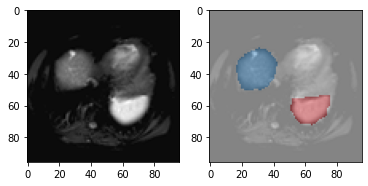

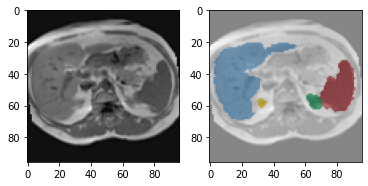

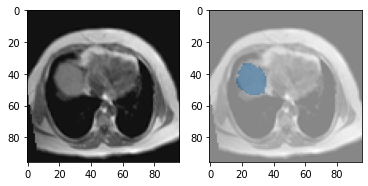

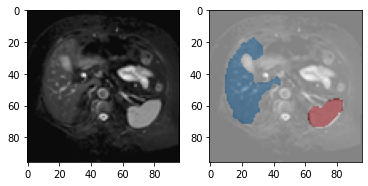

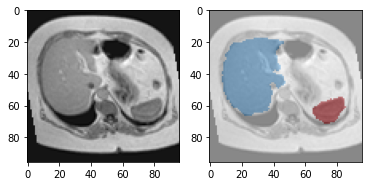

...

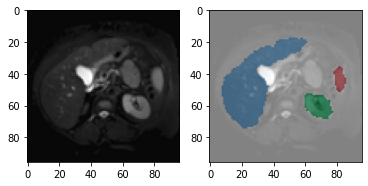

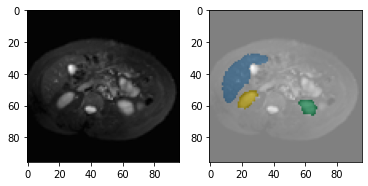

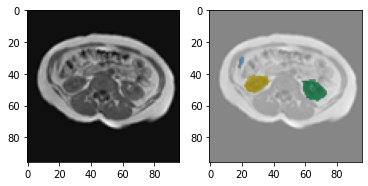

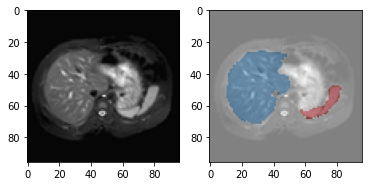

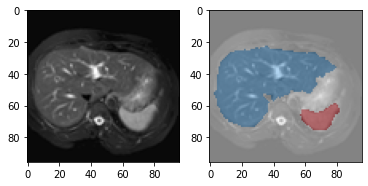

In [5]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import torchvision.transforms.functional as TF
import random

DISPLAY_LOADER = True
BATCH_SIZE = 32

data_set_name = "CHAOS"
n_class = 4

class ChaosDataset(torch.utils.data.Dataset):

    def __init__(self, transform=None, transform_Y=None, dataset_type='train'):

        self.data_type = dataset_type

        self.dcm_paths = [Path(dcm) for dcm in sorted(
                list(glob.glob('**/*.dcm', recursive=True))) if get_y_Path(Path(dcm)).exists()]
       
        val_fraction = 0.3
        if (dataset_type == 'valid'):
            self.dcm_paths = self.dcm_paths[:int(
                len(self.dcm_paths)*val_fraction)]
        else:
            self.dcm_paths = self.dcm_paths[int(
                len(self.dcm_paths)*val_fraction):]
                
        self.label_paths = [get_y_Path(dcm) for dcm in self.dcm_paths]

    def __getitem__(self, index):

        if isinstance(index, slice):
            return [self[ii] for ii in range(*index.indices(len(self)))]
        else:
            dcm_original = pydicom.dcmread(str(self.dcm_paths[index]))
            dcm = dcm_original.pixel_array
            dcm = dcm.astype(dtype=np.float32)
            
            #threshold transforms to remove background
            lows = dcm < 80
            dcm[lows] = 0

            label = str(self.label_paths[index])
            label = Image.open(str(self.label_paths[index]))
            label = np.array(label)
            dcm, label = self.x_y_transforms(dcm,label)

            return dcm, label

    def __len__(self):
        return len(self.dcm_paths)

    def x_y_transforms(self, image=None,mask=None):
        
        #convert into PIL image
        pil = transforms.ToPILImage()
        image = pil(image)
        mask = pil(mask)

        # Resize
        resize = transforms.Resize((128, 128), interpolation=Image.CUBIC)
        image = resize(image)
        mask_resize = transforms.Resize((128, 128), interpolation=Image.NEAREST)
        mask = mask_resize(mask)
        centerCop = transforms.CenterCrop(96)
        image = centerCop(image)
        mask = centerCop(mask)

        # Random Affine only for Training Data
        if(self.data_type=="train"):                    
          rand_affine = transforms.RandomAffine.get_params(degrees=(-10,10), translate=None, scale_ranges=(1,1), shears=(-10,10), img_size=image.size)   
          image = TF.affine(image, *rand_affine, resample=Image.CUBIC)
          mask = TF.affine(mask, *rand_affine, resample=Image.NEAREST)

        # Transform to tensor, expand dcm to 3 channels, and normalize
        trans_tensor = transforms.ToTensor()
        image = trans_tensor(image)
        mask = trans_tensor(mask)
        expand_3d = transforms.Lambda(lambda x: x.view(x.shape).expand(3, -1, -1))
        min_max = transforms.Lambda(lambda x: (x - x.min())/x.max())
        mean_val = transforms.Lambda(lambda x: x - x.mean())
        normalize = transforms.Normalize([0.485, 0.456, 0.406], [
                                 0.229, 0.224, 0.225])  # imagenet normalization
        image = expand_3d(image)
        image = min_max(image)
        image = mean_val(image)                                 
        image = normalize(image)

        #one-hot encode the mask(label)
        mask_to_label = transforms.Lambda(lambda x: mask2label(x, data_set_name=data_set_name))
        mask = mask_to_label(mask)
        
        return image, mask

def init_dataloaders(batch_size):

    train_set = ChaosDataset(dataset_type='train') 
    val_set = ChaosDataset(dataset_type='valid')

    image_datasets = {
        'train': train_set, 'val': val_set
    }

    dataloaders = {
        'train': DataLoader(train_set, batch_size=batch_size, shuffle=True, num_workers=0),
        'val': DataLoader(val_set, batch_size=batch_size, shuffle=True, num_workers=0)
    }

    return dataloaders

dataloaders = init_dataloaders(batch_size=BATCH_SIZE)

def display_data_loader(dataloaders=dataloaders, batch_size=32):
    dataIter = iter(dataloaders['train'])
    dcms, labels = next(dataIter)
    display_traindata(dcms[20:40], labels[20:40])
    
if (DISPLAY_LOADER):
    display_data_loader(dataloaders=dataloaders)

# DEFINE MODELS

We can define models to experiment with below. So far this tutorial has a ResNet UNet model (with a pretrained resnet18 backbone) and an interesting recently published model called a UNet++.

## - ResNet UNet Model


In [6]:
# reference: https://github.com/usuyama/pytorch-unet

import torch.nn.functional as F
import torch.nn as nn
import torchsummary
from torchvision import models
from torchsummary import summary

def convrelu(in_channels, out_channels, kernel, padding):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel, padding=padding),
        nn.ReLU(inplace=True),
    )

class ResNetUNet(nn.Module):
    def __init__(self, n_class):
        super().__init__()

        self.base_model = models.resnet18(pretrained=True)
        self.base_layers = list(self.base_model.children())

        self.layer0 = nn.Sequential(*self.base_layers[:3]) # size=(N, 64, x.H/2, x.W/2)
        self.layer0_1x1 = convrelu(64, 64, 1, 0)
        self.layer1 = nn.Sequential(*self.base_layers[3:5]) # size=(N, 64, x.H/4, x.W/4)
        self.layer1_1x1 = convrelu(64, 64, 1, 0)
        self.layer2 = self.base_layers[5]  # size=(N, 128, x.H/8, x.W/8)
        self.layer2_1x1 = convrelu(128, 128, 1, 0)
        self.layer3 = self.base_layers[6]  # size=(N, 256, x.H/16, x.W/16)
        self.layer3_1x1 = convrelu(256, 256, 1, 0)
        self.layer4 = self.base_layers[7]  # size=(N, 512, x.H/32, x.W/32)
        self.layer4_1x1 = convrelu(512, 512, 1, 0)

        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        self.conv_up3 = convrelu(256 + 512, 512, 3, 1)
        self.conv_up2 = convrelu(128 + 512, 256, 3, 1)
        self.conv_up1 = convrelu(64 + 256, 256, 3, 1)
        self.conv_up0 = convrelu(64 + 256, 128, 3, 1)

        self.conv_original_size0 = convrelu(3, 64, 3, 1)
        self.conv_original_size1 = convrelu(64, 64, 3, 1)
        self.conv_original_size2 = convrelu(64 + 128, 64, 3, 1)

        self.conv_last = nn.Conv2d(64, n_class, 1)

    def forward(self, input):
        x_original = self.conv_original_size0(input)
        x_original = self.conv_original_size1(x_original)

        layer0 = self.layer0(input)
        layer1 = self.layer1(layer0)
        layer2 = self.layer2(layer1)
        layer3 = self.layer3(layer2)
        layer4 = self.layer4(layer3)

        layer4 = self.layer4_1x1(layer4)
        x = self.upsample(layer4)
        layer3 = self.layer3_1x1(layer3)
        x = torch.cat([x, layer3], dim=1)
        x = self.conv_up3(x)

        x = self.upsample(x)
        layer2 = self.layer2_1x1(layer2)
        x = torch.cat([x, layer2], dim=1)
        x = self.conv_up2(x)

        x = self.upsample(x)
        layer1 = self.layer1_1x1(layer1)
        x = torch.cat([x, layer1], dim=1)
        x = self.conv_up1(x)

        x = self.upsample(x)
        layer0 = self.layer0_1x1(layer0)
        x = torch.cat([x, layer0], dim=1)
        x = self.conv_up0(x)

        x = self.upsample(x)
        x = torch.cat([x, x_original], dim=1)
        x = self.conv_original_size2(x)

        out = self.conv_last(x)

        return out

"""
# model is defined below in Select Model

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')  
model = ResNetUNet(n_class=n_class)
model = model.to(device)
summary(model, input_size = (3, 64,64))
"""

"\n# model is defined below in Select Model\n\ndevice = torch.device('cuda' if torch.cuda.is_available() else 'cpu')  \nmodel = ResNetUNet(n_class=n_class)\nmodel = model.to(device)\nsummary(model, input_size = (3, 64,64))\n"

##UNet++ Model


In [7]:
# reference: https://towardsdatascience.com/biomedical-image-segmentation-unet-991d075a3a4b

class conv_block_nested(nn.Module):

    def __init__(self, in_ch, mid_ch, out_ch):
        super(conv_block_nested, self).__init__()
        self.activation = nn.ReLU(inplace=True)
        self.conv1 = nn.Conv2d(in_ch, mid_ch, kernel_size=3, padding=1, bias=True)
        self.bn1 = nn.BatchNorm2d(mid_ch)
        self.conv2 = nn.Conv2d(mid_ch, out_ch, kernel_size=3, padding=1, bias=True)
        self.bn2 = nn.BatchNorm2d(out_ch)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.activation(x)

        x = self.conv2(x)
        x = self.bn2(x)
        output = self.activation(x)

        return output

class Nested_UNet(nn.Module):

    def __init__(self, n_class=4):
        super(Nested_UNet, self).__init__()
        
        out_ch = n_class
        in_ch=3

        n1 = 64
        filters = [n1 * 2, n1 * 4, n1 * 8, n1 * 16, n1 * 32] # Recently doubled filters for more parameters

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.Up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        # backbone
        self.conv0_0 = conv_block_nested(in_ch, filters[0], filters[0])
        self.conv1_0 = conv_block_nested(filters[0], filters[1], filters[1])
        self.conv2_0 = conv_block_nested(filters[1], filters[2], filters[2])
        self.conv3_0 = conv_block_nested(filters[2], filters[3], filters[3])
        self.conv4_0 = conv_block_nested(filters[3], filters[4], filters[4])

        self.conv0_1 = conv_block_nested(filters[0] + filters[1], filters[0], filters[0])
        self.conv1_1 = conv_block_nested(filters[1] + filters[2], filters[1], filters[1])
        self.conv2_1 = conv_block_nested(filters[2] + filters[3], filters[2], filters[2])
        self.conv3_1 = conv_block_nested(filters[3] + filters[4], filters[3], filters[3])

        self.conv0_2 = conv_block_nested(filters[0]*2 + filters[1], filters[0], filters[0])
        self.conv1_2 = conv_block_nested(filters[1]*2 + filters[2], filters[1], filters[1])
        self.conv2_2 = conv_block_nested(filters[2]*2 + filters[3], filters[2], filters[2])

        self.conv0_3 = conv_block_nested(filters[0]*3 + filters[1], filters[0], filters[0])
        self.conv1_3 = conv_block_nested(filters[1]*3 + filters[2], filters[1], filters[1])

        self.conv0_4 = conv_block_nested(filters[0]*4 + filters[1], filters[0], filters[0])

        self.final = nn.Conv2d(filters[0], out_ch, kernel_size=1)

        self.dropoutx0_0 = nn.Dropout(p=0.1)
        self.dropoutx1_0 = nn.Dropout(p=0.2)
        self.dropoutx2_0 = nn.Dropout(p=0.3)
        self.dropoutx3_0 = nn.Dropout(p=0.4)
        self.dropoutx4_0 = nn.Dropout(p=0.5)

        self.dropoutx0_4 = nn.Dropout(p=0.1)
        self.dropoutx1_3 = nn.Dropout(p=0.2)
        self.dropoutx2_2 = nn.Dropout(p=0.3)
        self.dropoutx3_1 = nn.Dropout(p=0.4)        

    def forward(self, x):

        x0_0 = self.conv0_0(x)
        x0_0_drop = self.dropoutx0_0(self.pool(x0_0))
        x1_0 = self.conv1_0(x0_0_drop)
        x0_1 = self.conv0_1(torch.cat([x0_0, self.Up(x1_0)], 1))

        x1_0_drop = self.dropoutx1_0(self.pool(x1_0))
        x2_0 = self.conv2_0(x1_0_drop)
        x1_1 = self.conv1_1(torch.cat([x1_0, self.Up(x2_0)], 1))
        x0_2 = self.conv0_2(torch.cat([x0_0, x0_1, self.Up(x1_1)], 1))

        x2_0_drop = self.dropoutx2_0(self.pool(x2_0))
        x3_0 = self.conv3_0(x2_0_drop)
        x2_1 = self.conv2_1(torch.cat([x2_0, self.Up(x3_0)], 1))
        x1_2 = self.conv1_2(torch.cat([x1_0, x1_1, self.Up(x2_1)], 1))
        x0_3 = self.conv0_3(torch.cat([x0_0, x0_1, x0_2, self.Up(x1_2)], 1))

        x3_0_drop = self.dropoutx3_0(self.pool(x3_0))
        x4_0 = self.conv4_0(x3_0_drop)
        x4_0_drop = self.dropoutx0_4(x4_0)
        x3_1 = self.conv3_1(torch.cat([x3_0, self.Up(x4_0_drop)], 1))
        x3_1 = self.dropoutx3_1(x3_1)
        x2_2 = self.conv2_2(torch.cat([x2_0, x2_1, self.Up(x3_1)], 1))
        x2_2 = self.dropoutx2_2(x2_2)
        x1_3 = self.conv1_3(torch.cat([x1_0, x1_1, x1_2, self.Up(x2_2)], 1))
        x1_3 = self.dropoutx1_3(x1_3)
        x0_4 = self.conv0_4(torch.cat([x0_0, x0_1, x0_2, x0_3, self.Up(x1_3)], 1))
        x0_4 = self.dropoutx0_4(x0_4)

        output = self.final(x0_4)
        return output

"""
# model is defined below in Select Model

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')  
model = Nested_UNet(n_class=n_class)
model = model.to(device)
summary(model, input_size = (3, 64,64))
"""

"\n# model is defined below in Select Model\n\ndevice = torch.device('cuda' if torch.cuda.is_available() else 'cpu')  \nmodel = Nested_UNet(n_class=n_class)\nmodel = model.to(device)\nsummary(model, input_size = (3, 64,64))\n"

## Select Model 

In [8]:
model_options = ["ResNet_UNet", "Nested_UNet"]
selected_model = "ResNet_UNet"

model_dict = {"ResNet_UNet": ResNetUNet(n_class=n_class),
              "Nested_UNet": Nested_UNet(n_class=n_class)}

model = model_dict[selected_model]

print(f"{selected_model} model selected.\n")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
summary(model, input_size = (3, 64,64))

ResNet_UNet model selected.

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           1,792
              ReLU-2           [-1, 64, 64, 64]               0
            Conv2d-3           [-1, 64, 64, 64]          36,928
              ReLU-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 32, 32]           9,408
            Conv2d-6           [-1, 64, 32, 32]           9,408
       BatchNorm2d-7           [-1, 64, 32, 32]             128
       BatchNorm2d-8           [-1, 64, 32, 32]             128
              ReLU-9           [-1, 64, 32, 32]               0
             ReLU-10           [-1, 64, 32, 32]               0
        MaxPool2d-11           [-1, 64, 16, 16]               0
        MaxPool2d-12           [-1, 64, 16, 16]               0
           Conv2d-13           [-1, 64, 16, 16]          36,864
          

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


# DEFINE TRAINING LOOP

In [9]:
%load_ext tensorboard
import time
import copy
import os
import json
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.tensorboard import SummaryWriter
from loss import dice_loss
from itertools import product
from collections import defaultdict


def calc_loss(pred, target, metrics, bce_weight=0.5):
    bce = F.binary_cross_entropy_with_logits(pred, target)

    pred = torch.sigmoid(pred)
    dice = dice_loss(pred, target)
    loss = bce * bce_weight + dice * (1 - bce_weight)

    metrics['bce'] += bce.data.cpu().numpy() * target.size(0)
    metrics['dice'] += dice.data.cpu().numpy() * target.size(0)
    metrics['loss'] += loss.data.cpu().numpy() * target.size(0)

    return loss

def metrics2tb(metrics, epoch_samples, phase, tb, epoch):
    for k in metrics.keys():
        tb.add_scalar(k, metrics[k] / epoch_samples, epoch)
        %reload_ext tensorboard
    
def print_metrics(metrics, epoch_samples, phase):
    print("printing metrics...")
    outputs = []
    for k in metrics.keys():
        outputs.append("{}: {:4f}".format(k, metrics[k] / epoch_samples))
    print("{}: {}".format(phase, ", ".join(outputs)))

def train_model(model, optimizer, scheduler, selected_model="no_selection_input", num_epochs=25):
    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = 1e10

    #tb writes data -> TensorBoard panel above
    tb = SummaryWriter(comment= f"_{selected_model}") 

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        since = time.time()

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                for param_group in optimizer.param_groups:
                    print("LR", param_group['lr'])

                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            metrics = defaultdict(float)
            epoch_samples = 0
            
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = calc_loss(outputs, labels, metrics)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                epoch_samples += inputs.size(0)

            print_metrics(metrics, epoch_samples, phase)            
            metrics2tb(metrics, epoch_samples, phase, tb, epoch)            
            epoch_loss = metrics['loss'] / epoch_samples

            # deep copy the model
            if phase == 'val' and epoch_loss < best_loss:
                print("saving best model")
                best_loss = epoch_loss
                best_model_wts = copy.deepcopy(model.state_dict())

        time_elapsed = time.time() - since
        print('{:.0f}m {:.0f}'.format(time_elapsed // 60, time_elapsed % 60))

        for name, weight in model.named_parameters():
            tb.add_histogram(name, weight, epoch)        

    print('Best val loss: {:4f}'.format(best_loss))
    
    run_name = '{}_{}_{:4f}'.format(selected_model, tb.log_dir, best_loss).replace(r'/', '-')
    run_name = run_name.replace(r'.','_')

    tb.close()

    # load best model weights
    model.load_state_dict(best_model_wts)

    return run_name, best_loss

# VISUALIZE RESULTS IN TENSORBOARD
##IMPORTANT! **YOU NEED TO RUN THIS CELL SEPARATELY TO VIEW THE PANEL DURING MODEL TRAINING**
### To display updated results, click the refresh icon
### Tip #1: Click the 'Fit domain to data' button under the graph, to resize curves automatically
### Tip #2: Don't forget to scroll down to view the 'loss' graph
### Tip #3: Select 'Reload data' in the TensorBoard settings

In [10]:
%reload_ext tensorboard
%tensorboard --logdir=runs --port=6008

Reusing TensorBoard on port 6008 (pid 374), started 0:51:09 ago. (Use '!kill 374' to kill it.)

<IPython.core.display.Javascript object>

# CALL TRAINING LOOP   
### Tip: Remember to refresh TensorBoard above to view graphical outputs!

Model loading and Parameters

In [11]:
def load_model_file():
    """
    automatically returns the file with the lowest validation loss
    """
    model_list = glob.glob("/content/UNET_COLAB/models/*.pth")
    model_file = ""
    if model_list:
        loss_values= []
        for model_path in model_list:
            name = Path("/content/UNET_COLAB/models/ResNet_UNet_runs-Oct27_22-47-17_df4192d031a9_ResNet_UNet_0_084873.pth").name
            loss_val = ".".join(str(name.replace(".pth", "")).split("_")[-2:])
            loss_values.append(float(loss_val))
        
        temp = loss_values[0]

        for loss in loss_values:
            if abs(temp) >= abs(loss):
                temp = abs(loss)
                model_file = model_list[loss_values.index(temp)]
    return model_file

# Hyperparameter Tuning
def hyperparameter_tuning(hyper_search=""):

    # Default hyperparameters

    parameters = dict(
            lr = [.001],
            step_size = [30],
            weight_decay = [.0001]
            )
    
    # TODO: implement hyperparameter optimization scheme here as needed.

    return parameters


Call Training Loop

In [12]:
for selected_model in ["ResNet_UNet"]:

    EPOCHS = 100

    load_model = False # change to True, to run a saved model in /content/UNET_COLAB/models
    batch_size = 32

    # Log path
    logs = {}
    log_path = "/content/UNET_COLAB/logs/"
    os.makedirs("/content/UNET_COLAB/logs",exist_ok=True)

    if load_model:
        #load prior model
        model_file = load_model_file() # add path of a model file file
        print("*** loading last saved model from:", model_file)
        model = model_dict[selected_model]
        model = model.to(device)
        model.load_state_dict(torch.load(model_file))
    else:
        #initalize new model
        print("*** creating new model...")
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        model = model_dict[selected_model]
        model = model.to(device)

    parameters = hyperparameter_tuning()
    param_values = [v for v in parameters.values()]
    print("param values ", list(product(*param_values)))

    for lr, step_size, weight_decay in product(*param_values):

        optimizer_ft = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=lr, weight_decay=weight_decay)
        exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=step_size, gamma=0.1)

        run_name, loss = train_model(model, optimizer_ft, exp_lr_scheduler, selected_model=selected_model, num_epochs=EPOCHS)

        torch.save(model.state_dict(), 'models/' + run_name+".pth") # SAVE PARAMETERS IN RUN NAME
        print("\n *** saving model as: ", 'models/' + run_name+".pth")

        # Generating  JSON log file of parameters for run 
        logs.setdefault(run_name,[]).append({"learning_rate":lr,
                                        "step_size":step_size,
                                        "weight_decay":weight_decay,
                                        "loss":loss,
                                        "epochs":EPOCHS,
                                        "batch_size":batch_size
                                        })

        print("*** creating new model...")

    # Save log file in JSON
    if os.path.isfile(log_path+"logs.json"): 
        with open(log_path+"logs.json") as file:
            data = json.load(file)
        data.update(logs)

        with open(log_path+"logs.json","w+") as file:
            json.dump(data,file,indent=4)
    else:
        with open(log_path+"logs.json","w+") as file:
            json.dump(logs,file,indent=4) 


*** creating new model...
param values  [(0.001, 30, 0.0001)]
Epoch 0/99
----------
LR 0.001


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:281: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:1041: UserWarning: Argument resample is deprecated and will be removed since v0.10.0. Pl

printing metrics...
train: bce: 0.218547, dice: 0.571853, loss: 0.395200
printing metrics...
val: bce: 0.124247, dice: 0.497536, loss: 0.310892
saving best model
0m 11
Epoch 1/99
----------
LR 0.001
printing metrics...
train: bce: 0.118338, dice: 0.423163, loss: 0.270751
printing metrics...
val: bce: 0.108595, dice: 0.400517, loss: 0.254556
saving best model
0m 10
Epoch 2/99
----------
LR 0.001
printing metrics...
train: bce: 0.087492, dice: 0.367548, loss: 0.227520
printing metrics...
val: bce: 0.078392, dice: 0.389384, loss: 0.233888
saving best model
0m 10
Epoch 3/99
----------
LR 0.001
printing metrics...
train: bce: 0.079135, dice: 0.357823, loss: 0.218479
printing metrics...
val: bce: 0.107383, dice: 0.391765, loss: 0.249574
0m 10
Epoch 4/99
----------
LR 0.001
printing metrics...
train: bce: 0.078967, dice: 0.352047, loss: 0.215507
printing metrics...
val: bce: 0.136230, dice: 0.379321, loss: 0.257776
0m 10
Epoch 5/99
----------
LR 0.001
printing metrics...
train: bce: 0.078340,

# RESULTS

### Here are my results after running the UNet++ and ResNet UNet models for 100 epochs.


### **A few observations**:
### 1. UNet++ has better performance on validation (dice loss).
### 2. ResNet UNet trains faster and is much smaller in size (ResNetUNet is 70 MB and the UNet++ is 559 MB)
### 3. ResNetUNet shows better performance initially during training, possibly due to a smaller number of model parameters and/or pretrained weights.

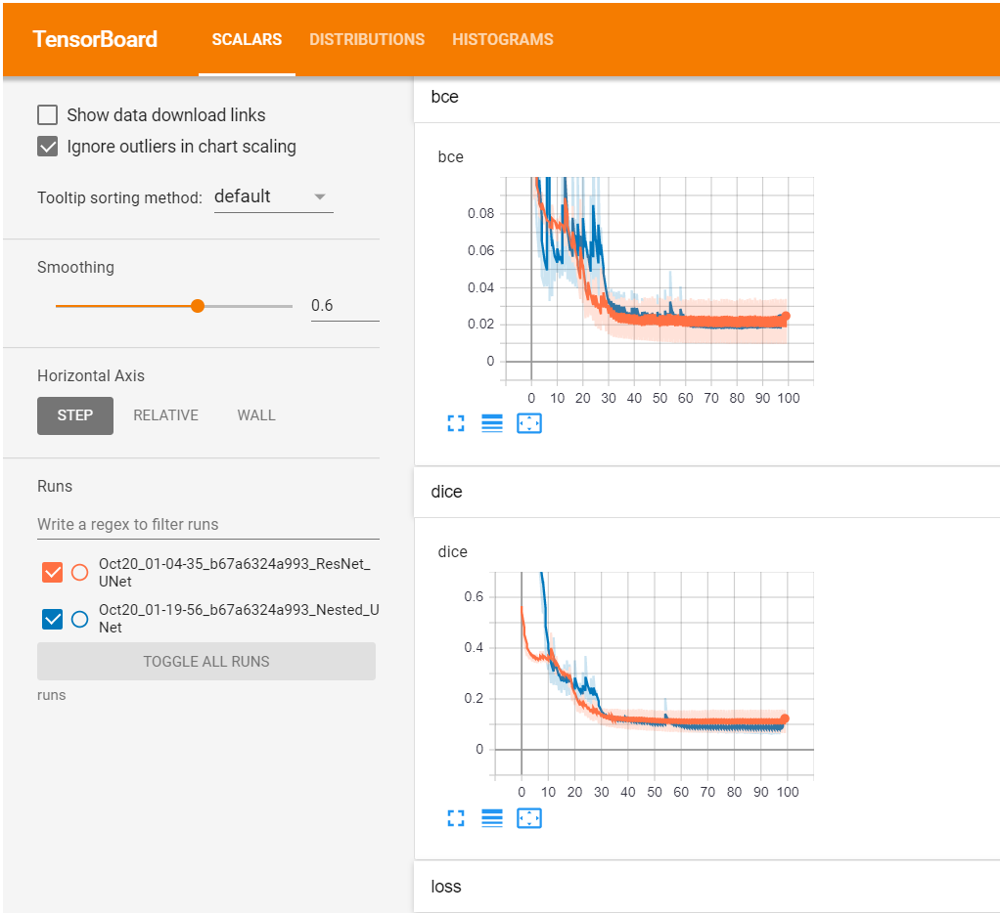

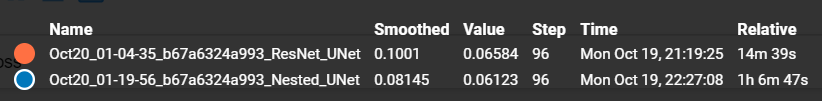

# RUN MODEL AND EVALUATE ON SHUFFLED VALIDATION IMGS

Note: These images are from the UNet++ model as this was trained last.

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:281: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


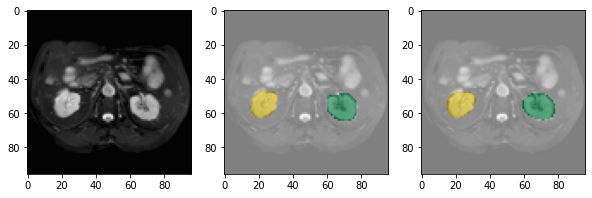

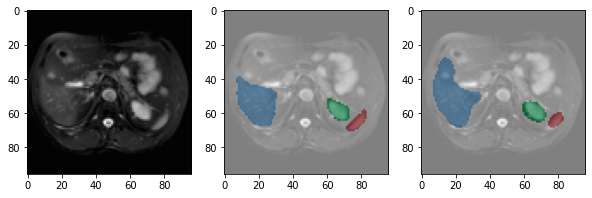

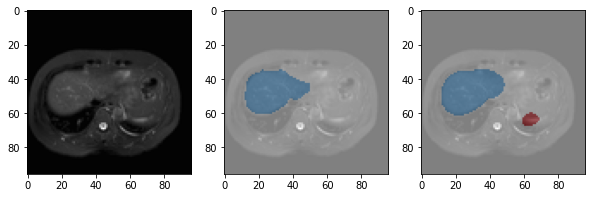

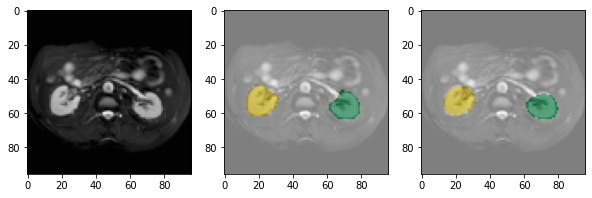

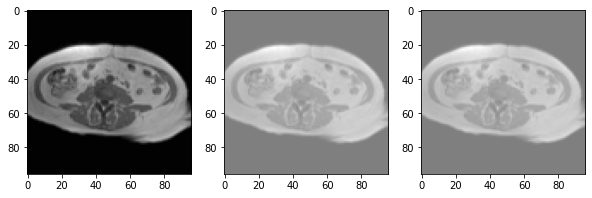

...

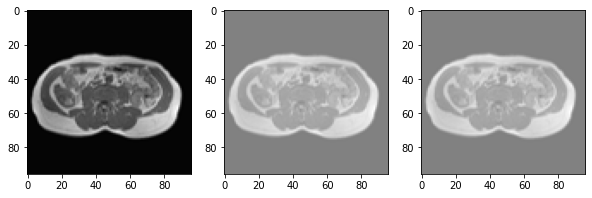

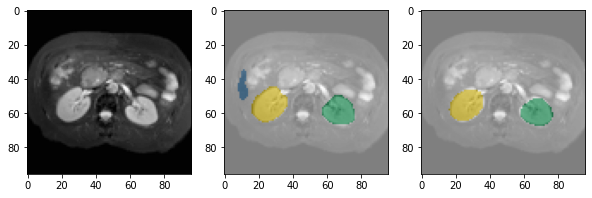

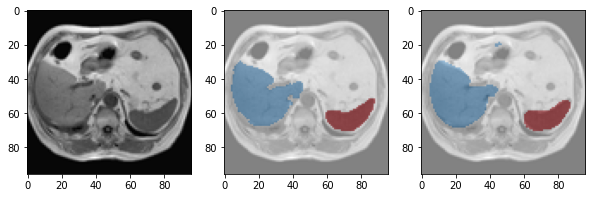

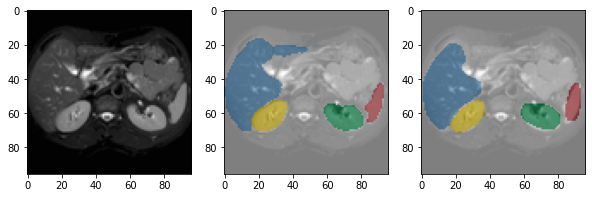

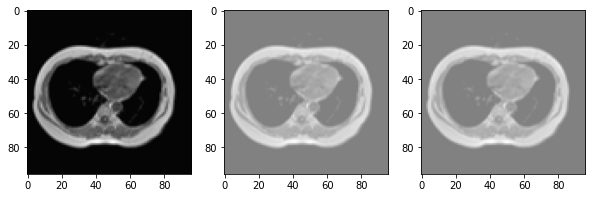

In [13]:
model.eval()   # Set model to the evaluation mode

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

valid_dataset = ChaosDataset(dataset_type='valid') 
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=True, num_workers=0)
data_iter = iter(valid_loader)

# Get the first batch
inputs, labels= next(data_iter)

inputs = inputs.to(device)
labels = labels.to(device)

# Predict
pred = model(inputs)
# The loss functions include the sigmoid function.
pred = torch.sigmoid(pred)
pred = pred.data.cpu().numpy()

inputs = inputs.detach().cpu().numpy()
labels = labels.detach().cpu().numpy()
display_valid_data(inputs,labels,pred)

## Let's check another batch, this time on non-shuffled validation data

It's interesting to see that the model occasionally makes errors with the left kidney (green) and spleen (red). We could potentially improve this by adjusting for class imbalance as the spleen is larger.

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:281: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


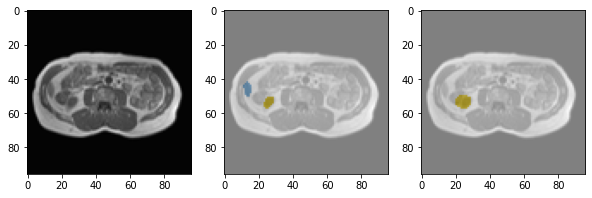

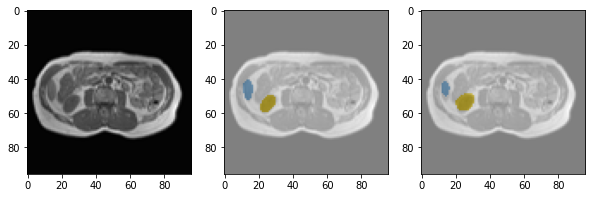

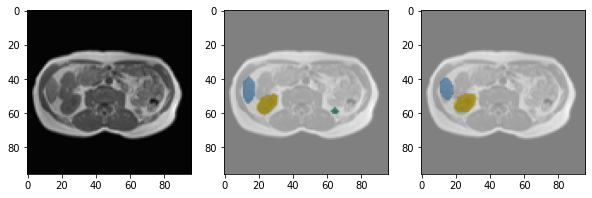

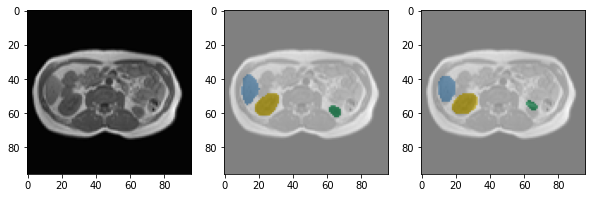

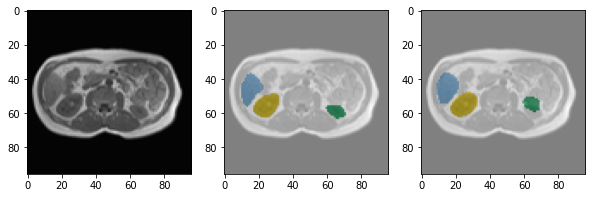

...

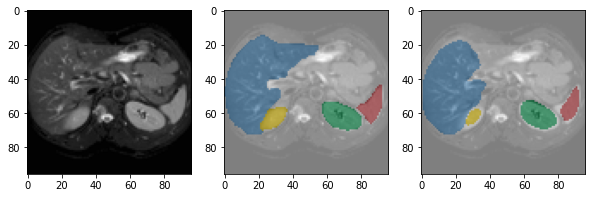

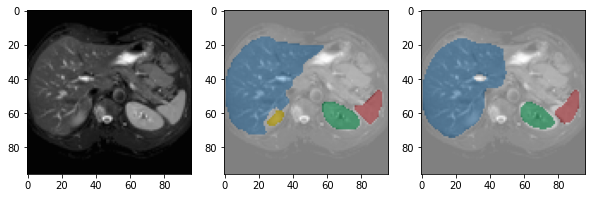

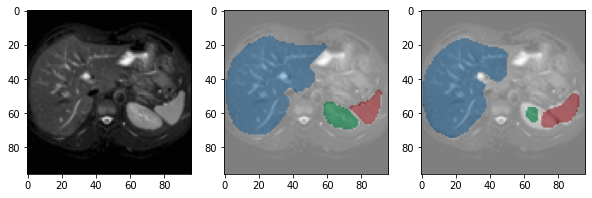

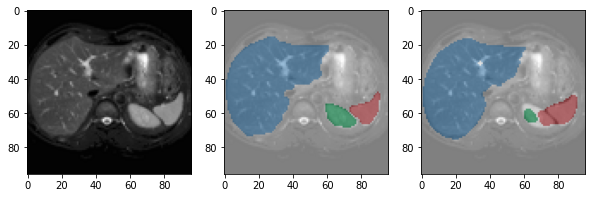

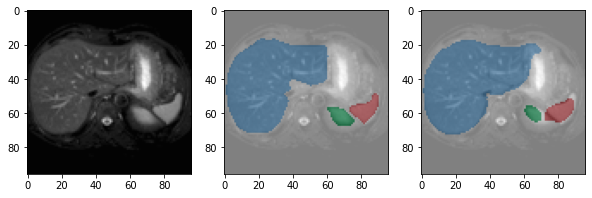

In [14]:
valid_loader = DataLoader(valid_dataset, batch_size=64, shuffle=False, num_workers=0)
data_iter = iter(valid_loader)

# Get the first batch
inputs, labels = next(data_iter)
inputs = inputs.to(device)
labels = labels.to(device)

# Predict
pred = model(inputs)
# The loss functions include the sigmoid function.
pred = torch.sigmoid(pred)
pred = pred.data.cpu().numpy()

inputs = inputs.detach().cpu().numpy()
labels = labels.detach().cpu().numpy()
display_valid_data(inputs[10:],labels[10:],pred[10:])


# RUN MODEL ON UNSEEN TEST DATA

Let's download the test data. Note: there are no labels for this data


In [15]:
!wget -q --show-progress https://www.dropbox.com/s/957znyr7mhtw5el/chaos_test.zip?dl=1 #download from dropbox
n_files = !unzip -l /content/UNET_COLAB/chaos_test.zip?dl=1 | grep . | wc -l #n_files is used for progress bar
!unzip -o /content/UNET_COLAB/chaos_test.zip?dl=1 | pv -l -s {n_files[0]} > /dev/null
!rm /content/UNET_COLAB/chaos_test.zip?dl=1
!printf "Data Unzipped!"

chaos_test.zip?dl=1 100%[===================>] 127.35M  95.5MB/s    in 1.3s    
1.95k 0:00:03 [ 494 /s] [==================================>   ] 93%            
Data Unzipped!

Run inference on test data

1951


/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:281: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1805: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


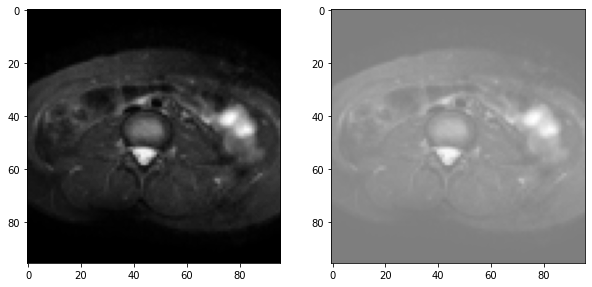

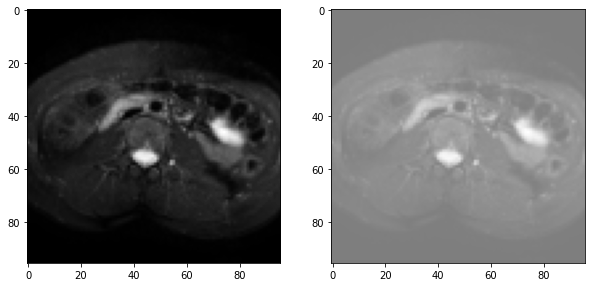

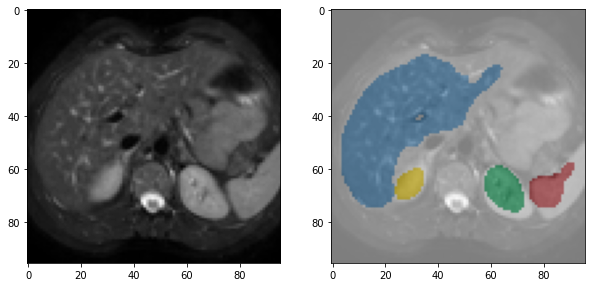

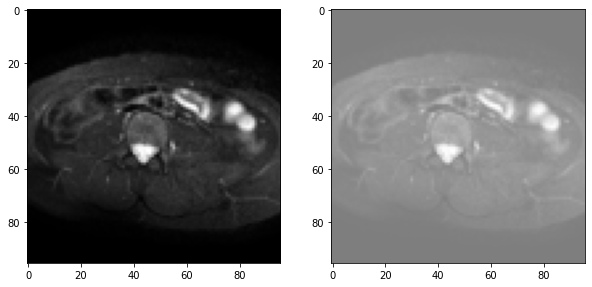

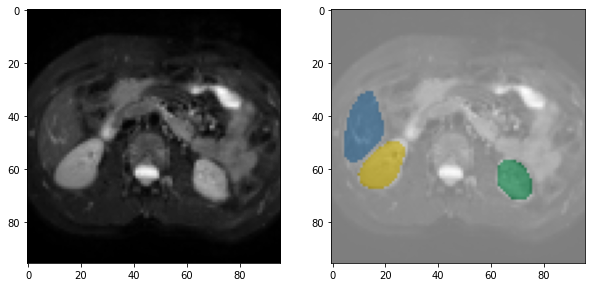

...

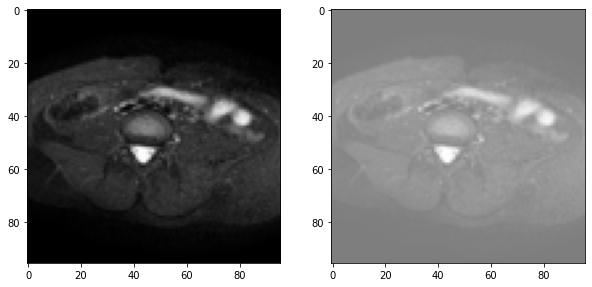

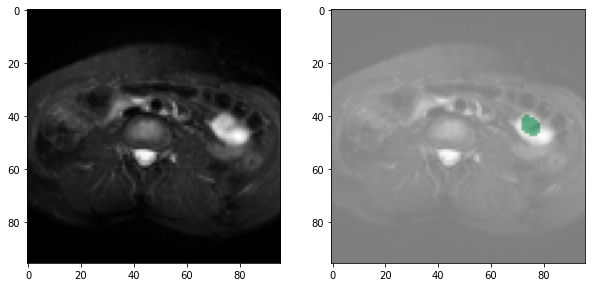

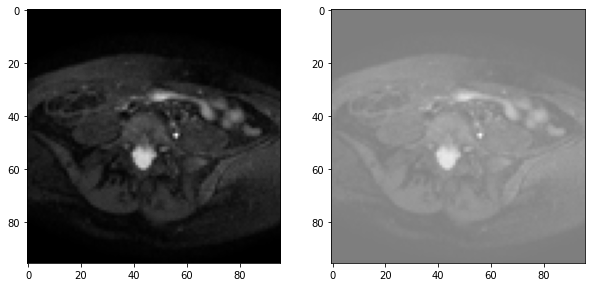

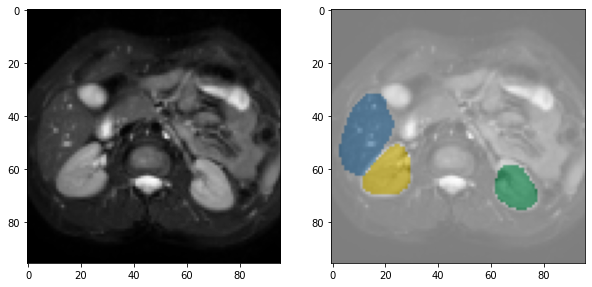

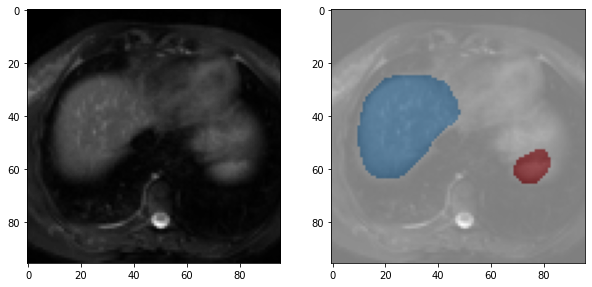

In [16]:
selected_model = "ResNet_UNet" # load_model_file picks best model which in will be the UNett++ (Nested_UNet)

import torch
from torch.utils.data import Dataset, DataLoader
n_class = 4
model_file = load_model_file()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model_dict[selected_model]
model = model.to(device)
model.load_state_dict(torch.load(model_file))
model.eval()   # Set model to the evaluation mode

def default_trans(dic_shape):

    trans = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((128, 128), interpolation=Image.CUBIC),               
        transforms.CenterCrop(96),                                             
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.view(x.shape).expand(3, -1, -1)),
        transforms.Lambda(lambda x: (x - x.min())/x.max()),
        transforms.Lambda(lambda x: x - x.mean()),
        transforms.Normalize([0.485, 0.456, 0.406], [
            0.229, 0.224, 0.225])  # imagenet normalization
    ])
    return trans

# Get dcm path
dcm_paths = glob.glob('/content/UNET_COLAB/chaos_test/**/*.dcm', recursive=True)
print(len(dcm_paths))
dcm_paths = dcm_paths[1:30]
for dcms in dcm_paths:
    ds = pydicom.dcmread(dcms)
    transform = default_trans(ds.pixel_array.shape)
    if transform:
        dcm = transform(ds.pixel_array.astype(dtype=np.float32))

        # Load dcm in Dataloader
        test_loader = DataLoader(
            dcm, batch_size=20, shuffle=True, num_workers=0)
        data_iter = iter(test_loader)
        
        # Get the first batch
        inputs = next(data_iter)
        inputs = inputs.to(device)
        
        # Predict
        inputs = inputs.view(-1, 3, 96, 96)  #changes
        
        pred = model(inputs)

        # The loss functions include the sigmoid function.
        pred = F.sigmoid(pred)
        pred = pred.data.cpu().numpy()

        #it predict the data 
        inputs = inputs.detach().cpu().numpy()
        display_inference(inputs, pred)


# CONCLUSION

In this tutorial we see how two different UNet type models work in the task of healthy abdominal organ segmentation. These two architectures/models have some interesting differences. For example, ResNet UNet is pretrained and smaller in size, while the UNet++ has an edge in final performance. It would be great to also test these models against more architectures on diverse data from multiple insitutions. We can also perform a hyperparameter search to see if we can improve performance futher.

### Further reading
Here are some references you might find interesting:

https://medium.com/@sh.tsang/review-unet-a-nested-u-net-architecture-biomedical-image-segmentation-57be56859b20

https://towardsdatascience.com/step-by-step-implementation-3d-convolutional-neural-network-in-keras-12efbdd7b130

https://towardsdatascience.com/u-nets-with-resnet-encoders-and-cross-connections-d8ba94125a2c

